In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [28]:
Electacity_load_df = pd.read_csv('load_forecasting_dataset_corrected.csv', encoding='latin1')

In [29]:
Electacity_load_df.head()

,Timestamp,Temperature (Â°C),Humidity (%),Wind Speed (m/s),Rainfall (mm),Solar Irradiance (W/mÂ²),GDP (LKR),Per Capita Energy Use (kWh),Electricity Price (LKR/kWh),Day of Week,Hour of Day,Month,Season,Public Event,Load Demand (kW)
0,1/1/2020 0:00,28.993428,75.011269,1.053861,4.140513,185.892561,925.621430,502.915605,20.454440,2,0,1,Summer,0,1599.342831
1,1/1/2020 0:15,27.723471,77.024015,1.085152,9.446997,281.782650,1020.823521,497.286366,27.776449,2,0,1,Summer,0,1472.347140
2,1/1/2020 0:30,29.295377,74.732958,3.363800,4.265813,328.942058,1028.847455,488.816292,21.097420,2,0,1,Summer,0,1629.537708
3,1/1/2020 0:45,31.046060,87.615995,2.539148,1.038103,336.407064,937.963002,468.038834,26.032137,2,0,1,Summer,1,1804.605971
4,1/1/2020 1:00,27.531693,79.709858,1.366819,4.201393,205.494256,934.477462,488.565716,27.079114,2,1,1,Summer,0,1453.169325


In [30]:
Electacity_load_df.shape

(189888, 15)

In [31]:
Electacity_load_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189888 entries, 0 to 189887
Data columns (total 15 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Timestamp                    189888 non-null  object 
 1   Temperature (Â°C)            189888 non-null  float64
 2   Humidity (%)                 189888 non-null  float64
 3   Wind Speed (m/s)             189888 non-null  float64
 4   Rainfall (mm)                189888 non-null  float64
 5   Solar Irradiance (W/mÂ²)     189888 non-null  float64
 6   GDP (LKR)                    189888 non-null  float64
 7   Per Capita Energy Use (kWh)  189888 non-null  float64
 8   Electricity Price (LKR/kWh)  189888 non-null  float64
 9   Day of Week                  189888 non-null  int64  
 10  Hour of Day                  189888 non-null  int64  
 11  Month                        189888 non-null  int64  
 12  Season                       189888 non-null  object 
 13 

In [32]:
Electacity_load_df.describe()

,Temperature (Â°C),Humidity (%),Wind Speed (m/s),Rainfall (mm),Solar Irradiance (W/mÂ²),GDP (LKR),Per Capita Energy Use (kWh),Electricity Price (LKR/kWh),Day of Week,Hour of Day,Month,Public Event,Load Demand (kW)
count,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000,189888.000000
mean,28.001544,79.998447,1.996106,5.014217,249.938317,1000.083804,499.909985,24.998521,3.001011,11.500000,6.253286,0.049650,1500.154422
std,1.999267,5.002994,1.002337,5.016601,50.008961,50.015166,20.040060,4.998985,1.998741,6.922205,3.465723,0.217222,199.926679
min,19.068792,57.930570,-2.829436,0.000004,53.558277,779.558268,407.111625,3.268386,0.000000,0.000000,1.000000,0.000000,606.879227
25%,26.652234,76.621433,1.317979,1.435887,216.176066,966.274369,486.400599,21.623224,1.000000,5.750000,3.000000,0.000000,1365.223394
50%,28.002750,80.003040,1.995783,3.480060,249.871247,1000.001997,499.947457,25.010508,3.000000,11.500000,6.000000,0.000000,1500.274982
75%,29.350713,83.368748,2.673888,6.954906,283.683824,1033.802397,513.405061,28.376540,5.000000,17.250000,9.000000,0.000000,1635.071296
max,37.124229,101.096832,6.301848,59.219061,449.497275,1251.690264,592.327679,47.420391,6.000000,23.000000,12.000000,1.000000,2412.422945


In [33]:
Electacity_load_df.dtypes

Timestamp                       object
Temperature (Â°C)              float64
Humidity (%)                   float64
Wind Speed (m/s)               float64
Rainfall (mm)                  float64
Solar Irradiance (W/mÂ²)       float64
GDP (LKR)                      float64
Per Capita Energy Use (kWh)    float64
Electricity Price (LKR/kWh)    float64
Day of Week                      int64
Hour of Day                      int64
Month                            int64
Season                          object
Public Event                     int64
Load Demand (kW)               float64
dtype: object

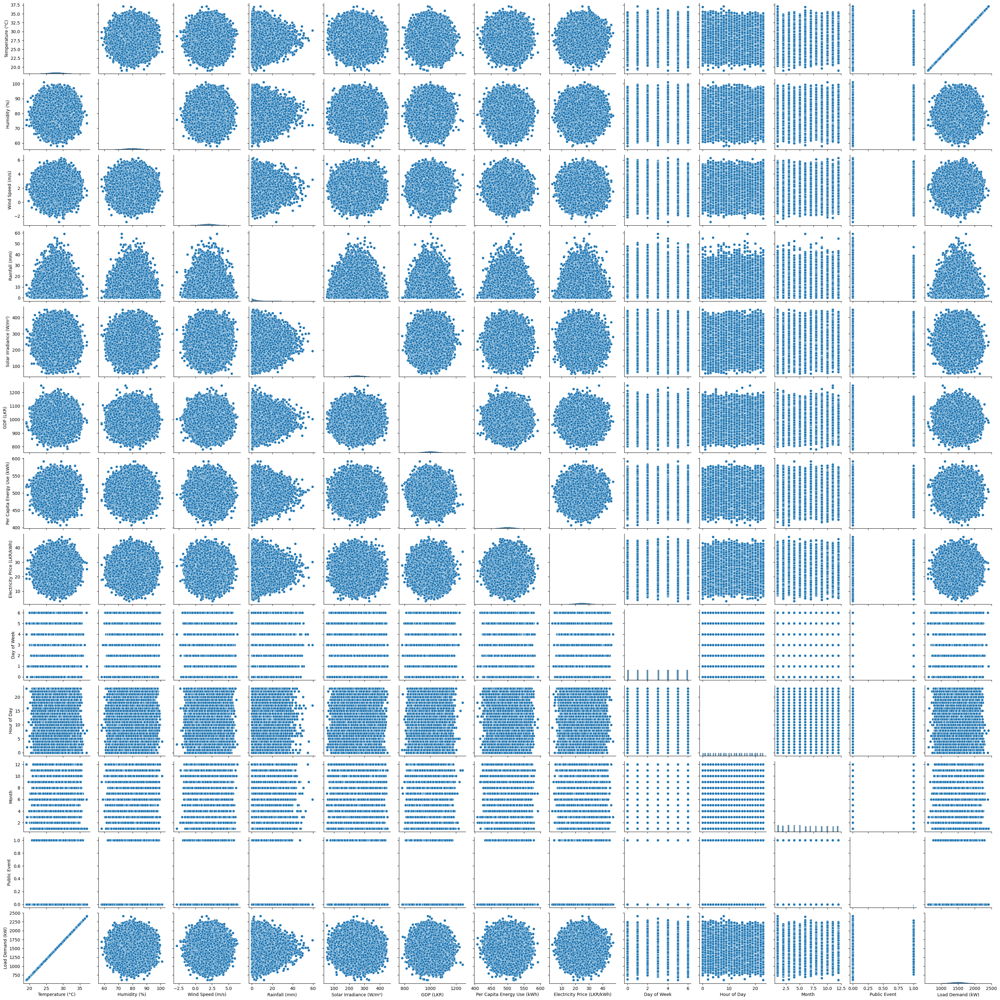

In [8]:
sns.pairplot(Electacity_load_df)
plt.show()

In [34]:

Electacity_load_df_numaric = Electacity_load_df.select_dtypes(include='number')


In [35]:
Electacity_load_df_numaric.columns


Index(['Temperature (Â°C)', 'Humidity (%)', 'Wind Speed (m/s)',
       'Rainfall (mm)', 'Solar Irradiance (W/mÂ²)', 'GDP (LKR)',
       'Per Capita Energy Use (kWh)', 'Electricity Price (LKR/kWh)',
       'Day of Week', 'Hour of Day', 'Month', 'Public Event',
       'Load Demand (kW)'],
      dtype='object')

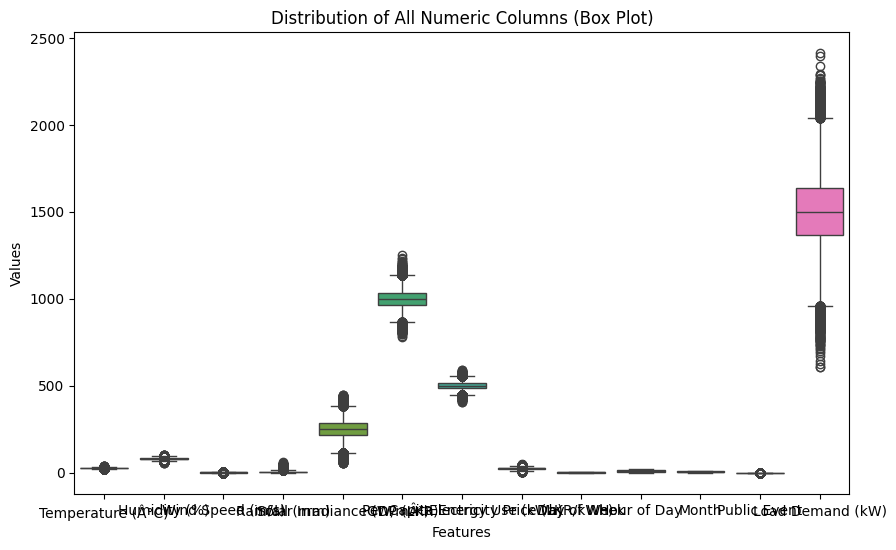

In [44]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=Electacity_load_df_numaric)
plt.title("Distribution of All Numeric Columns (Box Plot)")
plt.xlabel("Features")
plt.ylabel("Values")
plt.show()

In [36]:
correlation_Taget = Electacity_load_df_numaric.corr()['Load Demand (kW)'].sort_values(ascending=False)
print(correlation_Taget)

Load Demand (kW)               1.000000
Temperature (Â°C)              1.000000
Electricity Price (LKR/kWh)    0.002754
Solar Irradiance (W/mÂ²)       0.001682
Per Capita Energy Use (kWh)    0.001494
GDP (LKR)                      0.001159
Day of Week                   -0.000472
Wind Speed (m/s)              -0.001318
Humidity (%)                  -0.001357
Month                         -0.001375
Hour of Day                   -0.002629
Rainfall (mm)                 -0.004504
Public Event                  -0.005031
Name: Load Demand (kW), dtype: float64


In [37]:

Correlation_plot = Electacity_load_df_numaric.corr()['Load Demand (kW)'].drop('Load Demand (kW)')


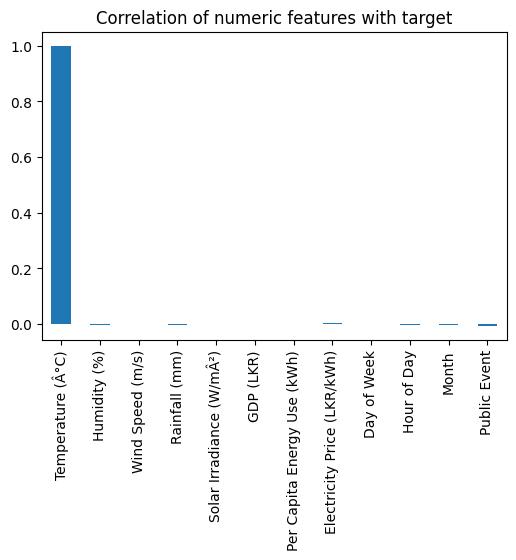

In [38]:
plt.figure(figsize=(6,4))
Correlation_plot.plot(kind='bar')
plt.title('Correlation of numeric features with target')
plt.show()

In [ ]:
correlation_Taget_GDP = Electacity_load_df_numaric.corr()['GDP (LKR)'].sort_values(ascending=False)
print(correlation_Taget_GDP)

GDP (LKR)                      1.000000
Hour of Day                    0.003707
Month                          0.002555
Per Capita Energy Use (kWh)    0.001858
Humidity (%)                   0.001753
Temperature (Â°C)              0.001159
Load Demand (kW)               0.001159
Wind Speed (m/s)               0.001046
Electricity Price (LKR/kWh)    0.000476
Day of Week                    0.000457
Rainfall (mm)                  0.000204
Public Event                   0.000008
Solar Irradiance (W/mÂ²)      -0.000371
Name: GDP (LKR), dtype: float64


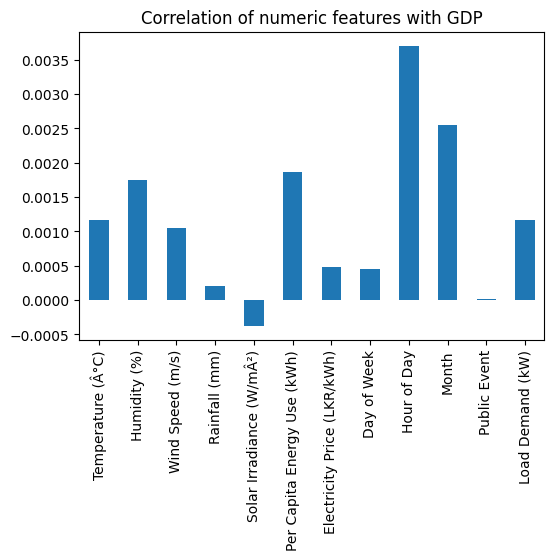

In [40]:
Correlation_plot_GDP = Electacity_load_df_numaric.corr()['GDP (LKR)'].drop('GDP (LKR)')
plt.figure(figsize=(6,4))
Correlation_plot_GDP.plot(kind='bar')
plt.title('Correlation of numeric features with GDP')
plt.show()

In [42]:
corr_matrix_load = Electacity_load_df_numaric.corr()
print(corr_matrix_load)

                             Temperature (Â°C)  Humidity (%)  \
Temperature (Â°C)                     1.000000     -0.001357   
Humidity (%)                         -0.001357      1.000000   
Wind Speed (m/s)                     -0.001318      0.000287   
Rainfall (mm)                        -0.004504      0.000366   
Solar Irradiance (W/mÂ²)              0.001682     -0.001544   
GDP (LKR)                             0.001159      0.001753   
Per Capita Energy Use (kWh)           0.001494      0.001530   
Electricity Price (LKR/kWh)           0.002754      0.000213   
Day of Week                          -0.000472      0.000336   
Hour of Day                          -0.002629      0.001154   
Month                                -0.001375      0.001763   
Public Event                         -0.005031     -0.001304   
Load Demand (kW)                      1.000000     -0.001357   

                             Wind Speed (m/s)  Rainfall (mm)  \
Temperature (Â°C)                   -0.

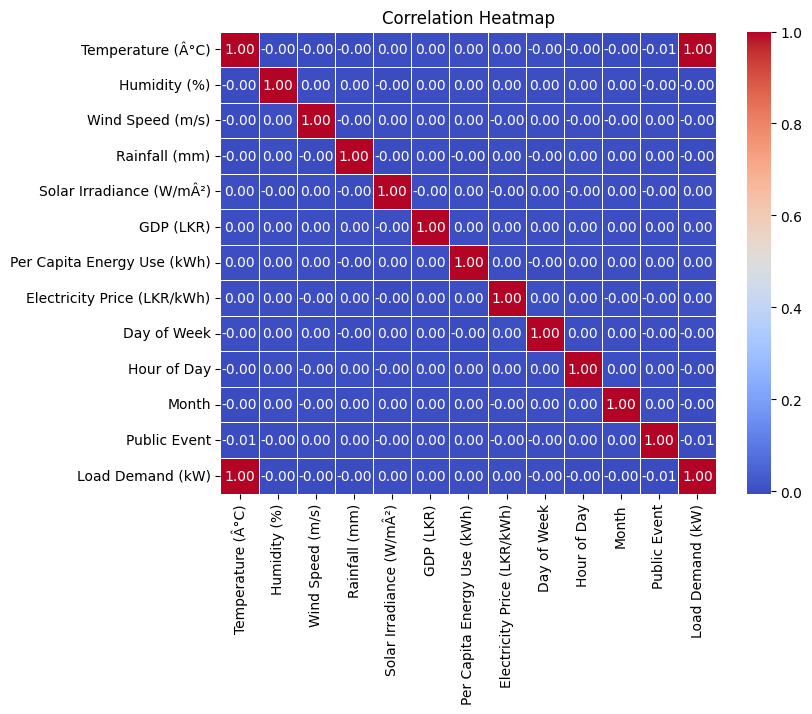

In [43]:
plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_matrix_load,
    annot=True,          # Show correlation values
    cmap='coolwarm',     # Color map: blue to red
    fmt=".2f",           # Format decimals
    linewidths=0.5       # Line between cells
)
plt.title("Correlation Heatmap")
plt.show()

### Sri Lanka Fruit Price 

In [4]:
Vegetable_Fruit_Price_df = pd.read_csv('Vegetables_fruit_prices_with_climate_130000_2020_to_2025.csv', encoding='latin1')

/tmp/ipykernel_2193/56401905.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  Vegetable_Fruit_Price_df = pd.read_csv('Vegetables_fruit_prices_with_climate_130000_2020_to_2025.csv', encoding='latin1')


In [5]:
Vegetable_Fruit_Price_df.head()

,Date,Region,Temperature (°C),Rainfall (mm),Humidity (%),Crop Yield Impact Score,fruit_Commodity,fruit_Price per Unit (LKR/kg),vegitable_Commodity,vegitable_Price per Unit (LKR/kg)
0,1/1/2020,Ampara,34.4,384.0,69.3,1.67,Banana,282.26,Winged Bean,376.43
1,1/1/2020,Anuradhapura,33.0,21.7,63.5,1.64,Banana,230.28,Winged Bean,210.15
2,1/1/2020,Badulla,35.7,121.8,73.5,1.73,Banana,317.02,Winged Bean,362.29
3,1/1/2020,Batticaloa,30.5,243.7,52.7,1.62,Banana,125.04,Winged Bean,169.92
4,1/1/2020,Colombo,35.4,3.2,93.1,0.54,Banana,117.30,Winged Bean,372.34


In [7]:
Vegetable_Fruit_Price_df.shape

(130000, 10)

In [8]:
Vegetable_Fruit_Price_df.columns

Index(['Date', 'Region', 'Temperature (°C)', 'Rainfall (mm)', 'Humidity (%)',
       'Crop Yield Impact Score', 'fruit_Commodity',
       'fruit_Price per Unit (LKR/kg)', 'vegitable_Commodity',
       'vegitable_Price per Unit (LKR/kg)'],
      dtype='object')

In [10]:
Vegetable_Fruit_Price_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130000 entries, 0 to 129999
Data columns (total 10 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Date                               130000 non-null  object 
 1   Region                             130000 non-null  object 
 2   Temperature (°C)                   130000 non-null  float64
 3   Rainfall (mm)                      130000 non-null  float64
 4   Humidity (%)                       130000 non-null  float64
 5   Crop Yield Impact Score            130000 non-null  object 
 6   fruit_Commodity                    130000 non-null  object 
 7   fruit_Price per Unit (LKR/kg)      130000 non-null  float64
 8   vegitable_Commodity                130000 non-null  object 
 9   vegitable_Price per Unit (LKR/kg)  130000 non-null  float64
dtypes: float64(5), object(5)
memory usage: 9.9+ MB


In [11]:
Vegetable_Fruit_Price_df.describe()

,Temperature (°C),Rainfall (mm),Humidity (%),fruit_Price per Unit (LKR/kg),vegitable_Price per Unit (LKR/kg)
count,130000.000000,130000.000000,130000.000000,130000.000000,130000.000000
mean,29.171526,181.935109,72.981717,275.576550,274.554938
std,5.078410,116.312786,12.751335,130.338096,129.637557
min,20.000000,0.400000,50.100000,50.020000,50.010000
25%,24.700000,74.300000,61.600000,161.550000,160.930000
50%,29.400000,172.000000,74.200000,278.500000,274.730000
75%,33.700000,277.400000,83.800000,387.340000,385.650000
max,38.000000,399.000000,95.000000,499.990000,499.970000


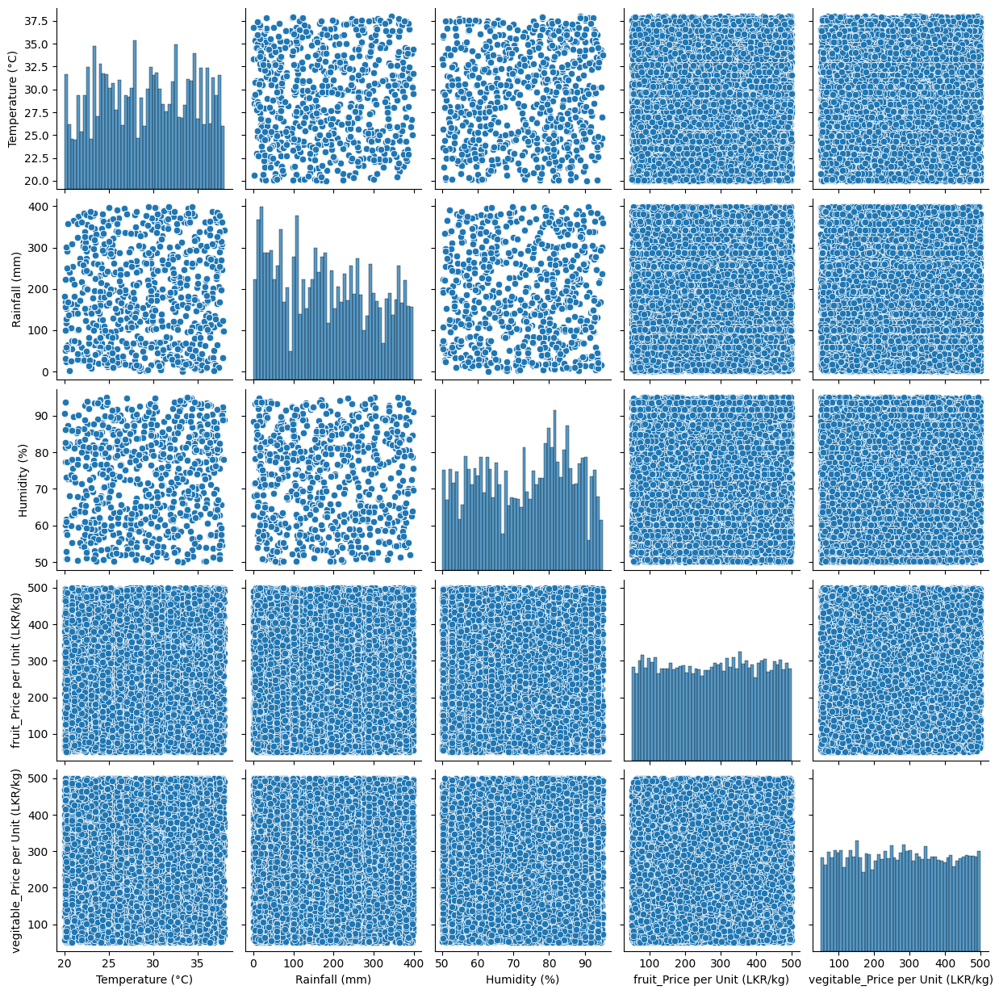

In [12]:
sns.pairplot(Vegetable_Fruit_Price_df)
plt.show()

In [13]:

Vegetable_Fruit_Price_df_numaric = Vegetable_Fruit_Price_df.select_dtypes(include='number')


In [14]:
Vegetable_Fruit_Price_df_numaric.columns

Index(['Temperature (°C)', 'Rainfall (mm)', 'Humidity (%)',
       'fruit_Price per Unit (LKR/kg)', 'vegitable_Price per Unit (LKR/kg)'],
      dtype='object')

In [15]:
correlation_VTaget = Vegetable_Fruit_Price_df_numaric.corr()['fruit_Price per Unit (LKR/kg)'].sort_values(ascending=False)
print(correlation_VTaget)

fruit_Price per Unit (LKR/kg)        1.000000
Rainfall (mm)                        0.009256
vegitable_Price per Unit (LKR/kg)    0.005669
Temperature (°C)                    -0.002270
Humidity (%)                        -0.002550
Name: fruit_Price per Unit (LKR/kg), dtype: float64


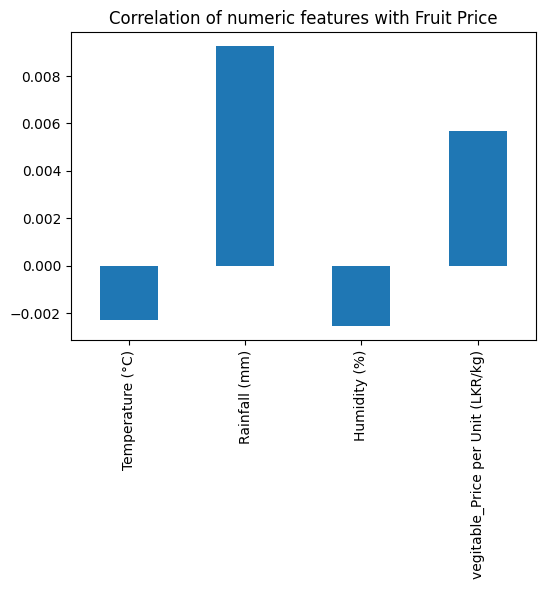

In [17]:
Correlation_plot_VFruitPrice = Vegetable_Fruit_Price_df_numaric.corr()['fruit_Price per Unit (LKR/kg)'].drop('fruit_Price per Unit (LKR/kg)')
plt.figure(figsize=(6,4))
Correlation_plot_VFruitPrice.plot(kind='bar')
plt.title('Correlation of numeric features with Fruit Price')
plt.show()

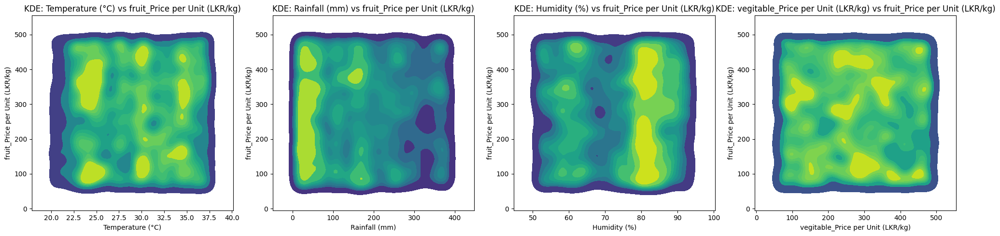

In [24]:
# Define dependent variable
y_col = 'fruit_Price per Unit (LKR/kg)'

# Independent variables (all numeric except the target)
x_cols = [col for col in Vegetable_Fruit_Price_df_numaric.columns if col != y_col]

# Create subplots
plt.figure(figsize=(5 * len(x_cols), 5))

for i, col in enumerate(x_cols, 1):
    plt.subplot(1, len(x_cols), i)
    sns.kdeplot(x=Vegetable_Fruit_Price_df[col], y=Vegetable_Fruit_Price_df[y_col], fill=True, cmap="viridis")
    plt.title(f'KDE: {col} vs {y_col}')
    plt.xlabel(col)
    plt.ylabel(y_col)

plt.tight_layout()
plt.show()

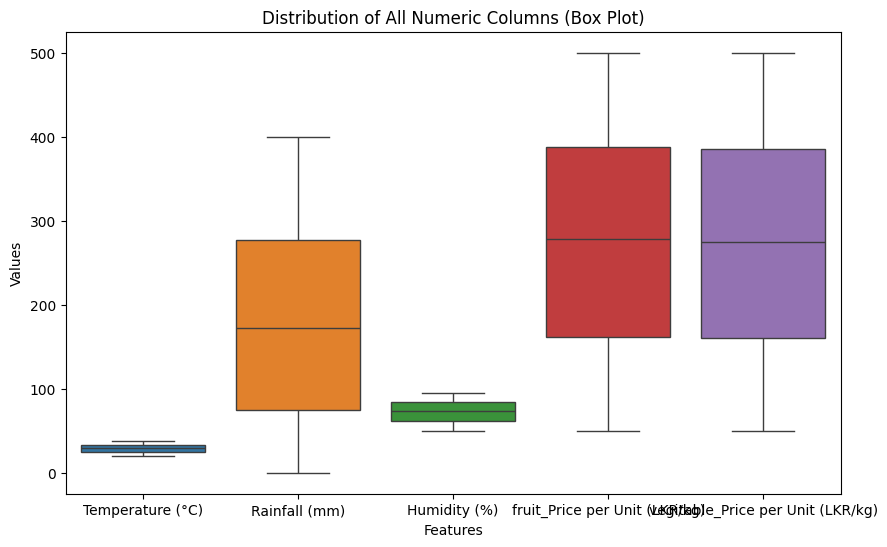

In [19]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=Vegetable_Fruit_Price_df_numaric)
plt.title("Distribution of All Numeric Columns (Box Plot)")
plt.xlabel("Features")
plt.ylabel("Values")
plt.show()


In [18]:
# Correlation coefficients
corr_matrix = Vegetable_Fruit_Price_df_numaric.corr()
print(corr_matrix)

                                   Temperature (°C)  Rainfall (mm)  \
Temperature (°C)                           1.000000       0.038606   
Rainfall (mm)                              0.038606       1.000000   
Humidity (%)                               0.075303      -0.024943   
fruit_Price per Unit (LKR/kg)             -0.002270       0.009256   
vegitable_Price per Unit (LKR/kg)          0.009334       0.004328   

                                   Humidity (%)  \
Temperature (°C)                       0.075303   
Rainfall (mm)                         -0.024943   
Humidity (%)                           1.000000   
fruit_Price per Unit (LKR/kg)         -0.002550   
vegitable_Price per Unit (LKR/kg)      0.010835   

                                   fruit_Price per Unit (LKR/kg)  \
Temperature (°C)                                       -0.002270   
Rainfall (mm)                                           0.009256   
Humidity (%)                                           -0.002550   


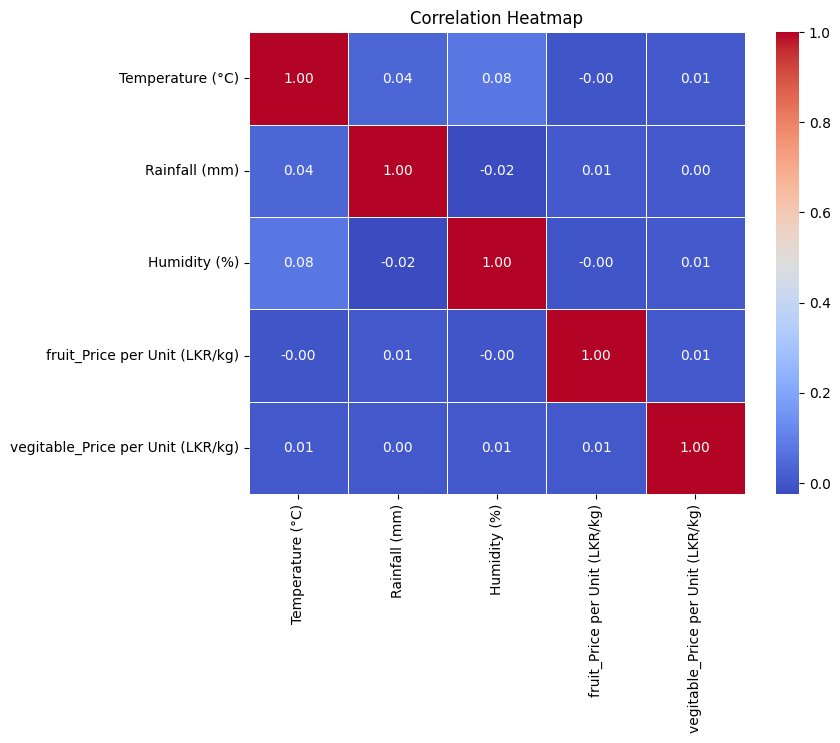

In [26]:
plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_matrix,
    annot=True,          # Show correlation values
    cmap='coolwarm',     # Color map: blue to red
    fmt=".2f",           # Format decimals
    linewidths=0.5       # Line between cells
)
plt.title("Correlation Heatmap")
plt.show()

### Sri Lanka Whetear Data Set

In [3]:
SL_Climate_df = pd.read_csv('Sri_Lanka_Climate_Data.csv')

In [4]:
SL_Climate_df.head()

,date,latitude,longitude,temperature_2m_max,temperature_2m_min,precipitation_sum
0,2022-11-11 00:00:00+00:00,6.066667,80.231034,28.7975,24.4975,1.000000
1,2022-11-12 00:00:00+00:00,6.066667,80.231034,27.7475,23.2975,17.800001
2,2022-11-13 00:00:00+00:00,6.066667,80.231034,26.6475,23.2475,13.599999
3,2022-11-14 00:00:00+00:00,6.066667,80.231034,28.1475,22.8975,17.900002
4,2022-11-15 00:00:00+00:00,6.066667,80.231034,28.3475,22.6475,23.499998


In [5]:
SL_Climate_df.shape

(314028, 6)

In [6]:
SL_Climate_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 314028 entries, 0 to 314027
Data columns (total 6 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   date                314028 non-null  object 
 1   latitude            314028 non-null  float64
 2   longitude           314028 non-null  float64
 3   temperature_2m_max  314028 non-null  float64
 4   temperature_2m_min  314028 non-null  float64
 5   precipitation_sum   314028 non-null  float64
dtypes: float64(5), object(1)
memory usage: 14.4+ MB


In [7]:
SL_Climate_df.describe()

,latitude,longitude,temperature_2m_max,temperature_2m_min,precipitation_sum
count,314028.000000,314028.000000,314028.000000,314028.000000,314028.000000
mean,7.642036,80.697701,30.763622,23.154171,5.907706
std,0.920018,0.511793,3.324311,2.406658,9.548971
min,6.066667,79.775862,14.709500,6.759500,0.000000
25%,6.900000,80.306897,28.797500,22.149000,0.300000
50%,7.566667,80.686207,30.558000,23.391500,1.900000
75%,8.400000,81.065517,33.019500,24.717500,7.500000
max,9.733333,81.824138,41.164997,30.319500,186.100000


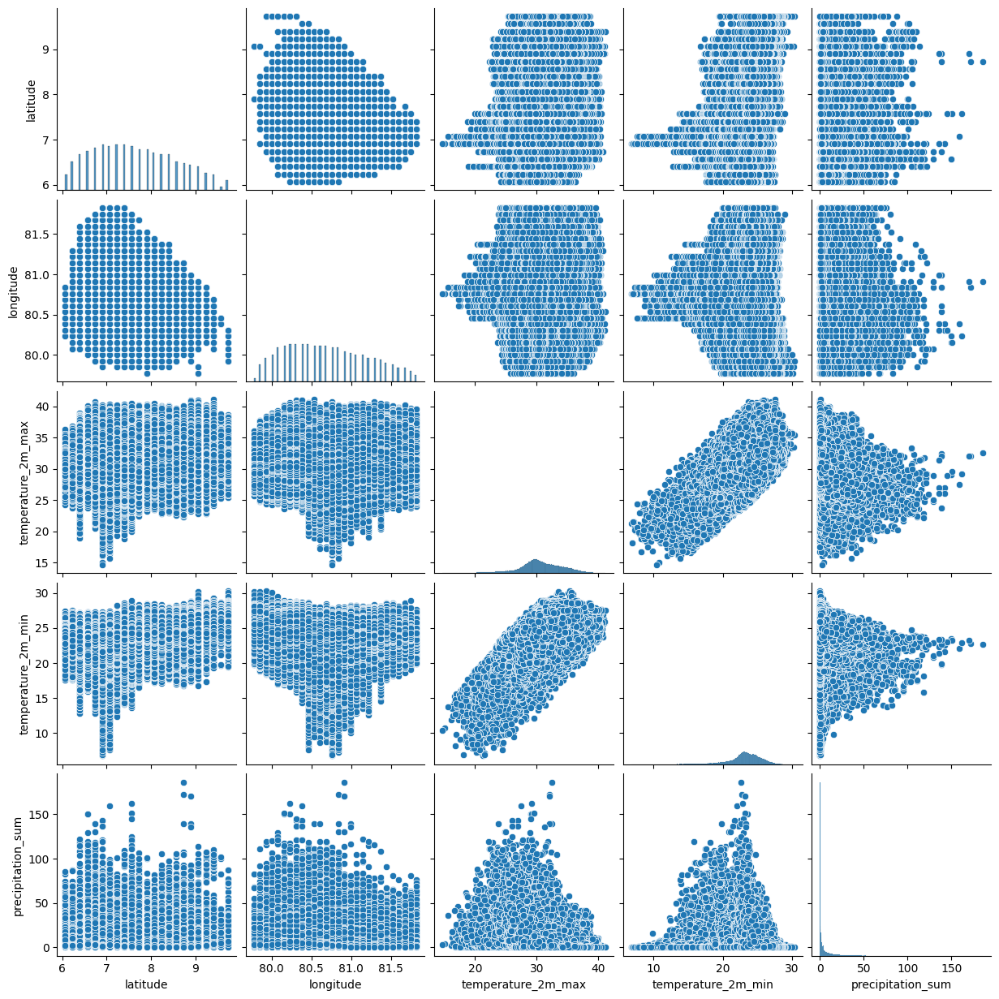

In [8]:
sns.pairplot(SL_Climate_df)
plt.show()

In [9]:
SL_Climate_df_numaric = SL_Climate_df.select_dtypes(include='number')

In [10]:
SL_Climate_df_numaric.columns

Index(['latitude', 'longitude', 'temperature_2m_max', 'temperature_2m_min',
       'precipitation_sum'],
      dtype='object')

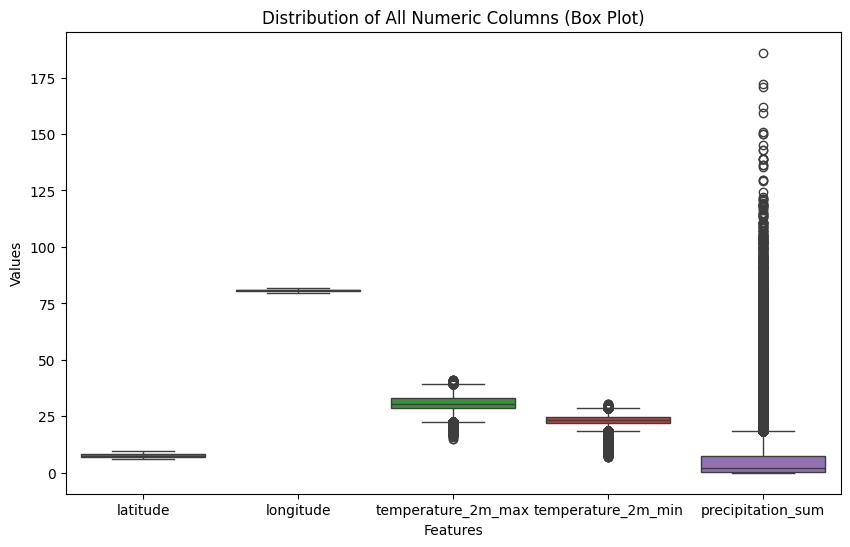

In [11]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=SL_Climate_df_numaric)
plt.title("Distribution of All Numeric Columns (Box Plot)")
plt.xlabel("Features")
plt.ylabel("Values")
plt.show()


In [12]:
correlation_SLClimate = SL_Climate_df_numaric.corr()
print(correlation_SLClimate)

                    latitude  longitude  temperature_2m_max  \
latitude            1.000000  -0.251462            0.257456   
longitude          -0.251462   1.000000            0.126248   
temperature_2m_max  0.257456   0.126248            1.000000   
temperature_2m_min  0.345381  -0.027616            0.679669   
precipitation_sum  -0.138463  -0.041821           -0.322223   

                    temperature_2m_min  precipitation_sum  
latitude                      0.345381          -0.138463  
longitude                    -0.027616          -0.041821  
temperature_2m_max            0.679669          -0.322223  
temperature_2m_min            1.000000          -0.117601  
precipitation_sum            -0.117601           1.000000  


<Figure size 600x400 with 0 Axes>

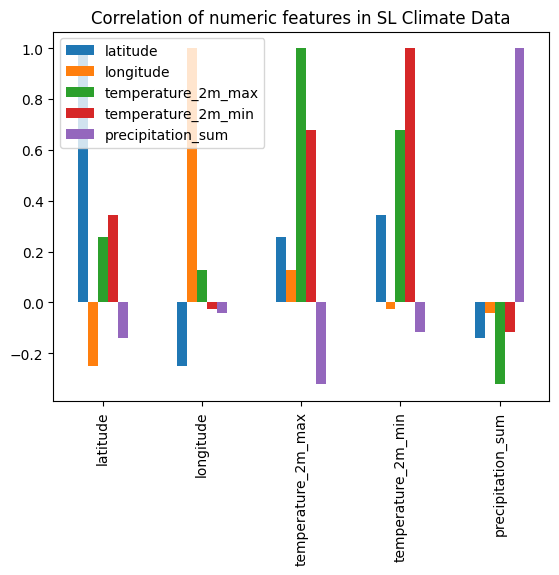

In [14]:
Correlation_plot_SLClimate  = SL_Climate_df_numaric.corr()
plt.figure(figsize=(6,4))
Correlation_plot_SLClimate.plot(kind='bar')
plt.title('Correlation of numeric features in SL Climate Data')
plt.show()

/tmp/ipykernel_2647/2317319220.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


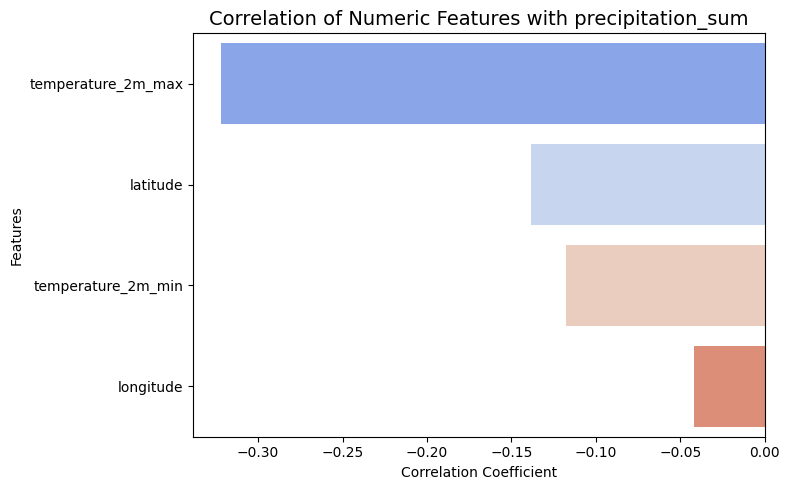

In [15]:
# Compute correlation matrix
corr_matrix = SL_Climate_df_numaric.corr()

# Choose your target variable (dependent variable)
target_col = 'precipitation_sum'   # 

# Get correlation of all features with target
corr_with_target = corr_matrix[target_col].drop(target_col).sort_values()

# Plot horizontal bar plot with Seaborn
plt.figure(figsize=(8, 5))
sns.barplot(
    x=corr_with_target.values,
    y=corr_with_target.index,
    palette='coolwarm'
)

plt.title(f'Correlation of Numeric Features with {target_col}', fontsize=14)
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

### Sri Lanka Wehther By Town

In [16]:
SL_Wheather_df = pd.read_csv('SriLanka_Weather_Dataset.csv')

In [17]:
SL_Wheather_df.head()

,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,sunset,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,2010-01-01,2,30.0,22.7,26.1,34.4,25.2,29.2,2010-01-01T00:52,2010-01-01T12:35,...,0.0,11.7,27.4,20,4.58,7.0,79.899994,16.0,Sri Lanka,Colombo
1,2010-01-02,51,29.9,23.5,26.2,33.8,26.2,29.8,2010-01-02T00:52,2010-01-02T12:36,...,1.0,13.0,27.0,24,3.84,7.0,79.899994,16.0,Sri Lanka,Colombo
2,2010-01-03,51,29.5,23.2,26.0,34.3,26.3,29.9,2010-01-03T00:53,2010-01-03T12:36,...,3.0,12.3,27.4,16,3.65,7.0,79.899994,16.0,Sri Lanka,Colombo
3,2010-01-04,2,28.9,21.9,25.3,31.6,23.4,27.8,2010-01-04T00:53,2010-01-04T12:37,...,0.0,17.0,34.6,356,3.79,7.0,79.899994,16.0,Sri Lanka,Colombo
4,2010-01-05,1,28.1,21.3,24.5,30.1,23.1,26.1,2010-01-05T00:53,2010-01-05T12:37,...,0.0,18.7,37.1,355,4.97,7.0,79.899994,16.0,Sri Lanka,Colombo


In [18]:
SL_Wheather_df.shape

(147480, 24)

In [19]:
SL_Wheather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147480 entries, 0 to 147479
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   time                        147480 non-null  object 
 1   weathercode                 147480 non-null  int64  
 2   temperature_2m_max          147480 non-null  float64
 3   temperature_2m_min          147480 non-null  float64
 4   temperature_2m_mean         147480 non-null  float64
 5   apparent_temperature_max    147480 non-null  float64
 6   apparent_temperature_min    147480 non-null  float64
 7   apparent_temperature_mean   147480 non-null  float64
 8   sunrise                     147480 non-null  object 
 9   sunset                      147480 non-null  object 
 10  shortwave_radiation_sum     147480 non-null  float64
 11  precipitation_sum           147480 non-null  float64
 12  rain_sum                    147480 non-null  float64
 13  snowfall_sum  

In [21]:
SL_Wheather_df.describe()

,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,shortwave_radiation_sum,precipitation_sum,rain_sum,snowfall_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation
count,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.0,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000,147480.000000
mean,46.647776,29.242367,23.899913,26.225590,34.112355,27.711096,30.317066,18.483513,5.975637,5.975637,0.0,8.762524,15.561288,34.796932,182.881625,3.896143,7.123334,80.263335,111.733333
std,21.623876,2.120345,2.059291,1.842147,2.966144,2.835051,2.540275,4.214270,10.215294,10.215294,0.0,7.191010,6.213737,10.214372,93.670247,1.023126,0.798620,0.488871,266.380824
min,0.000000,17.500000,12.100000,16.300000,18.500000,10.500000,16.300000,1.230000,0.000000,0.000000,0.0,0.000000,2.200000,11.500000,0.000000,0.420000,6.000000,79.800020,0.000000
25%,51.000000,28.200000,23.100000,25.600000,32.400000,26.400000,29.200000,16.220000,0.400000,0.400000,0.0,2.000000,11.000000,26.600000,88.000000,3.260000,6.800003,79.899994,7.000000
50%,53.000000,29.200000,24.300000,26.400000,34.200000,28.400000,30.800000,19.130000,2.600000,2.600000,0.0,8.000000,15.000000,33.100000,215.000000,3.890000,6.900002,80.000000,14.000000
75%,61.000000,30.400000,25.200000,27.200000,36.100000,29.600000,31.900000,21.510000,7.500000,7.500000,0.0,14.000000,18.900000,41.800000,249.000000,4.550000,7.400002,80.399994,27.000000
max,65.000000,37.500000,30.000000,31.800000,43.400000,34.700000,37.400000,28.980000,338.800000,338.800000,0.0,24.000000,50.200000,91.800000,360.000000,8.140000,9.700005,81.800020,1281.000000


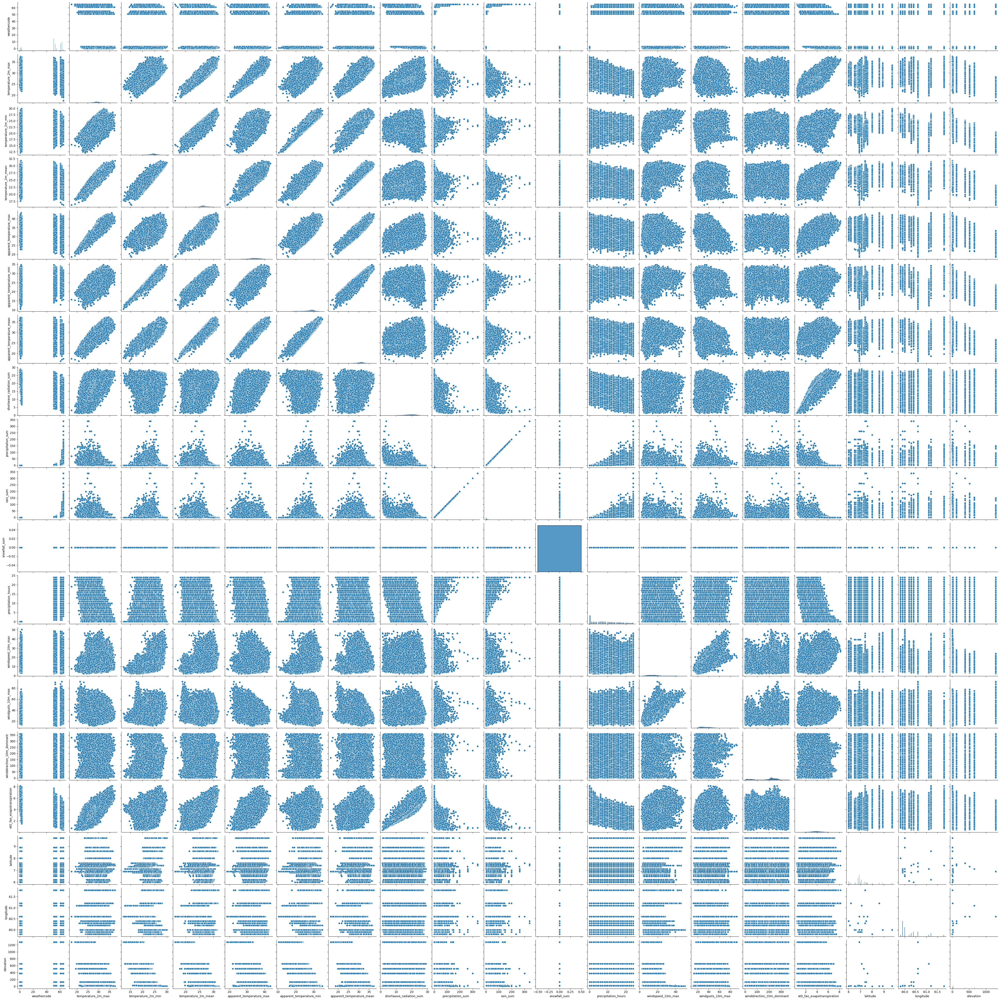

In [22]:
sns.pairplot(SL_Wheather_df)
plt.show()

In [27]:
SL_Weather_df_numaric = SL_Wheather_df.select_dtypes(include='number')

In [28]:
correlation_SLWeather = SL_Weather_df_numaric.corr()
print(correlation_SLWeather)

                            weathercode  temperature_2m_max  \
weathercode                    1.000000           -0.286452   
temperature_2m_max            -0.286452            1.000000   
temperature_2m_min             0.100353            0.549288   
temperature_2m_mean           -0.150776            0.861296   
apparent_temperature_max      -0.016989            0.854049   
apparent_temperature_min       0.246193            0.518615   
apparent_temperature_mean      0.099155            0.746201   
shortwave_radiation_sum       -0.463124            0.565234   
precipitation_sum              0.395169           -0.298439   
rain_sum                       0.395169           -0.298439   
snowfall_sum                        NaN                 NaN   
precipitation_hours            0.648309           -0.436443   
windspeed_10m_max             -0.112285            0.053805   
windgusts_10m_max              0.038021           -0.154331   
winddirection_10m_dominant     0.227239            0.01

In [29]:
SL_Weather_df_numaric.columns

Index(['weathercode', 'temperature_2m_max', 'temperature_2m_min',
       'temperature_2m_mean', 'apparent_temperature_max',
       'apparent_temperature_min', 'apparent_temperature_mean',
       'shortwave_radiation_sum', 'precipitation_sum', 'rain_sum',
       'snowfall_sum', 'precipitation_hours', 'windspeed_10m_max',
       'windgusts_10m_max', 'winddirection_10m_dominant',
       'et0_fao_evapotranspiration', 'latitude', 'longitude', 'elevation'],
      dtype='object')

/workspaces/MyMSCAssignments/venv-MLAssignment/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


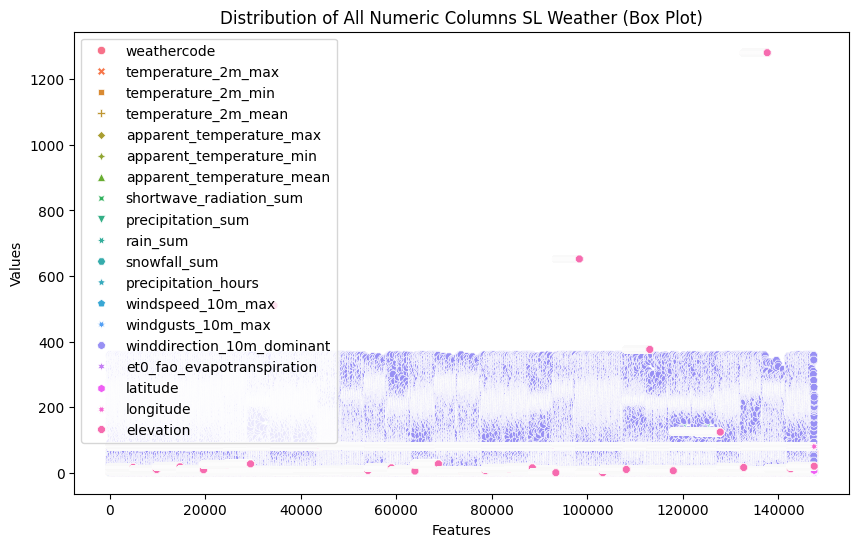

In [32]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=SL_Weather_df_numaric)
plt.title("Distribution of All Numeric Columns SL Weather (Box Plot)")
plt.xlabel("Features")
plt.ylabel("Values")
plt.show()

/tmp/ipykernel_2647/1696225926.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


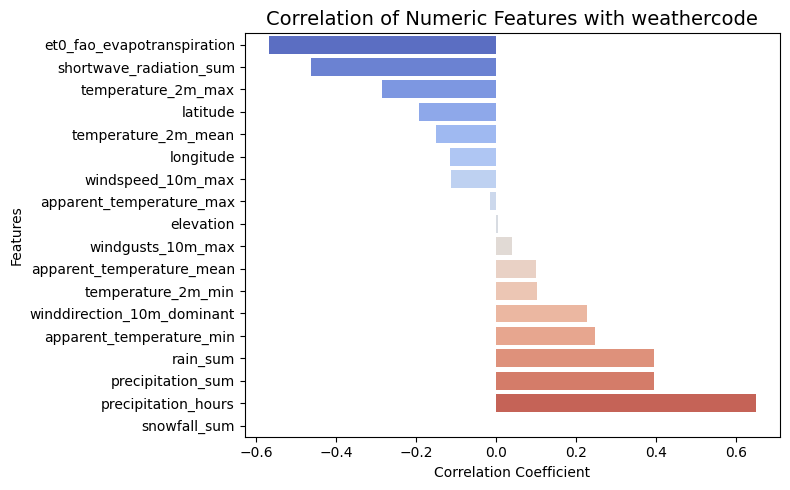

In [31]:
# Compute correlation matrix
corr_matrix = SL_Weather_df_numaric.corr()

# Choose your target variable (dependent variable)
target_col = 'weathercode'   # 

# Get correlation of all features with target
corr_with_target = corr_matrix[target_col].drop(target_col).sort_values()

# Plot horizontal bar plot with Seaborn
plt.figure(figsize=(8, 5))
sns.barplot(
    x=corr_with_target.values,
    y=corr_with_target.index,
    palette='coolwarm'
)

plt.title(f'Correlation of Numeric Features with {target_col}', fontsize=14)
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

/tmp/ipykernel_2647/4285820854.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(SL_Weather_df_numaric[col], fill=True, color='steelblue')


<Figure size 1500x2800 with 0 Axes>

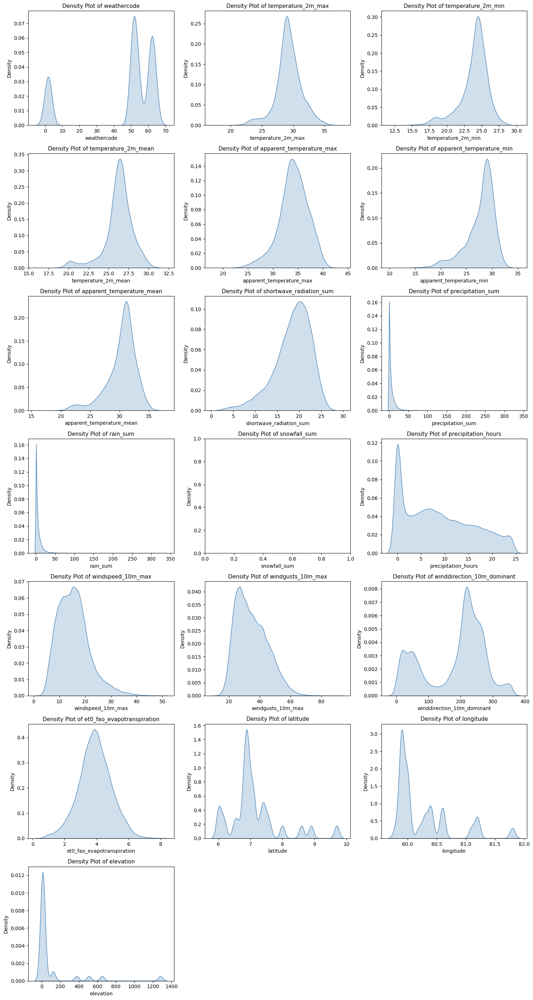

In [33]:
num_cols = corr_matrix = SL_Weather_df_numaric.corr().columns
num_features = len(num_cols)

# Set up grid layout
n_cols = 3  # number of plots per row
n_rows = (num_features + n_cols - 1) // n_cols
plt.figure(figsize=(n_cols * 5, n_rows * 4))

plt.figure(figsize=(n_cols * 5, n_rows * 4))

for i, col in enumerate(num_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.kdeplot(SL_Weather_df_numaric[col], fill=True, color='steelblue')
    plt.title(f'Density Plot of {col}', fontsize=11)
    plt.xlabel(col)
    plt.ylabel('Density')

plt.tight_layout()
plt.show()